# Clase 30


# Proyecto Final – PLN y Aplicaciones Interactivas en Google Colab

## Objetivo del proyecto
Desarrollar una aplicación interactiva en Google Colab que resuelva un problema real de búsqueda, clasificación o recomendación de información textual, integrando:

- Procesamiento de Lenguaje Natural (PLN).
- Técnicas de modelado vistas en el curso: TF-IDF, Word2Vec, LDA, Keras.
- Interfaz interactiva en Colab usando `from IPython.display import Javascript, display, HTML`.
- (Opcional pero muy recomendado) Uso de SQL para gestionar y consultar datos.

## Descripción general
Cada estudiante o grupo deberá:

1. Elegir un caso de uso:
   - Buscador inteligente para un catálogo.
   - Clasificador automático de documentos o productos.
   - Sistema de recomendación.

2. Seleccionar un dataset real.

3. Implementar un pipeline completo:
   - Carga y exploración de datos.
   - Preprocesamiento de texto.
   - Vectorización y modelado.
   - (Opcional) Consultas en SQL para filtrar o explorar información.
   - Interfaz interactiva en Colab.

4. Probar la aplicación con entradas del usuario.

## Integración opcional con SQL (muy recomendable)
Usar SQL permite:

- Filtrar datos antes del procesamiento.
- Guardar resultados procesados para consultas rápidas.
- Integrar consultas SQL en la interfaz interactiva.

Ejemplo:
```python
import sqlite3
import pandas as pd

# Guardar en base de datos SQLite
conn = sqlite3.connect('dataset.db')
df.to_sql('peliculas', conn, if_exists='replace', index=False)

# Consulta filtrando por género
query = "SELECT * FROM peliculas WHERE genero LIKE '%acción%'"
df_accion = pd.read_sql_query(query, conn)
```

Sugerencia: Si lo usas, documenta cómo SQL mejora tu flujo de trabajo.

## Requerimientos técnicos
- Entorno: Google Colab.
- Lenguaje: Python 3.

Librerías mínimas:
```python
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from IPython.display import Javascript, display, HTML
```

Opcionales:
- `gensim` para Word2Vec.
- `keras` / `tensorflow` para clasificación.
- `sqlite3` para SQL.
- `matplotlib` / `seaborn` para visualización.

## Casos de uso sugeridos
- Buscador inteligente para un catálogo de películas, libros o productos.
- Clasificador automático de reseñas, noticias o documentos.
- Sistema de recomendación de productos, películas, libros o artículos.
- Asistente de búsqueda académica.
- Sistema de preguntas y respuestas sobre una base textual.

## Sugerencia de datasets
- IMDb Reviews – https://ai.stanford.edu/~amaas/data/sentiment/
- Amazon Fine Food Reviews – https://www.kaggle.com/datasets/snap/amazon-fine-food-reviews
- AG News Classification – https://www.kaggle.com/datasets/amananandrai/ag-news-classification-dataset
- BBC News Dataset – https://www.kaggle.com/datasets/yufengdev/bbc-fulltext-and-category
- SMS Spam Collection – https://www.kaggle.com/datasets/uciml/sms-spam-collection-dataset
- Wikipedia Movie Plots – https://www.kaggle.com/datasets/jrobischon/wikipedia-movie-plots

## Formato de entrega
- Notebook en Colab con:
  - Código comentado.
  - Resultados visibles.
  - Interfaz interactiva.
  - (Opcional) Uso de SQL.
- Documento PDF con:
  - Resumen del proyecto.
  - Capturas de la app.
  - Explicación del modelo.

## Evaluación
| Criterio | Ponderación |
|----------|-------------|
| Preparación y limpieza de datos | 20% |
| Implementación del modelo de PLN | 25% |
| Interfaz interactiva en Colab | 25% |
| (Opcional) Uso de SQL documentado | +10% extra |
| Resultados, análisis y documentación | 20% |


#  Mini-App

## Mini-App: Buscador Semántico de Referencias Artísticas para Inspiración Visual
Este mini-proyecto consiste en el desarrollo de una aplicación interactiva en Google Colab que permite a los usuarios encontrar obras de arte relevantes para su práctica de dibujo, basándose en descripciones o temas escritos por el usuario.

### Funcionalidades:
- Búsqueda semántica basada en descripciones escritas por el usuario (ej. “composición simétrica en paisajes”, “uso del color expresivo”, etc.), utilizando modelos como SentenceTransformer (all-MiniLM-L6-v2).
- Visualización automática de obras relevantes a través de imágenes reales del dataset APDDv2.
- Sistema de recomendación a partir de embeddings generados a partir de comentarios estéticos.
- Uso opcional de SQLite para almacenar y consultar metadatos estéticos y categorías, como parte de una capa de análisis o filtros.

###Técnicas de PLN utilizadas:
- Generación de embeddings semánticos con Sentence-BERT (all-MiniLM-L6-v2).
- Similitud de coseno para recuperación de obras relevantes.
- TF-IDF o Word2Vec (como comparación alternativa si se desea).
- Limpieza y tokenización básica del corpus.

### Datos:
- APDDv2-10023.csv: Anotaciones estéticas, comentarios lingüísticos, categorías y puntajes.
- APDDv2-images.zip: Imágenes correspondientes al dataset (nombre de archivo = filename).

### Objetivo final:
Crear una herramienta útil para artistas o estudiantes que buscan referencias visuales organizadas por estilo, composición o impacto estético, enriquecida con técnicas de procesamiento de lenguaje natural y recuperación semántica.

### Parte 1 Primer boceto con dataset antiguo

Esta seccion no es de utilidad al momento de la evaluacion final, ya que se utilizo un dataset que resulto no ser muy util, dado la poca cantidad de imagenes y la poca informacion que nos entregaba el dataset.

In [ ]:
# Cargar los datos en /content
from google.colab import files
files.upload()  # Selecciona tu archivo kaggle.json cuando se abra el diálogo

# Crea el directorio de trabajo
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Descarga el dataset
!kaggle datasets download -d thedownhill/art-images-drawings-painting-sculpture-engraving
!unzip -q art-images-drawings-painting-sculpture-engraving.zip -d art_dataset


Dataset URL: https://www.kaggle.com/datasets/thedownhill/art-images-drawings-painting-sculpture-engraving
License(s): ODbL-1.0
art-images-drawings-painting-sculpture-engraving.zip: Skipping, found more recently modified local copy (use --force to force download)
replace art_dataset/dataset/dataset_updated/training_set/drawings/01dee7c857692cce250fcc7fba309f3f.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
import os
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
from IPython.display import Image, display, HTML
from google.colab import output

# Cargar imágenes y etiquetas desde la estructura de carpetas
base_path = "art_dataset/dataset/dataset_updated/training_set"

data = []
for class_name in os.listdir(base_path):
    class_path = os.path.join(base_path, class_name)
    if os.path.isdir(class_path):
        for img_file in os.listdir(class_path):
            if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(class_path, img_file)
                data.append({
                    "filename": img_file,
                    "filepath": img_path,
                    "label": class_name,
                    "text": f"{class_name} {img_file}"
                })

df = pd.DataFrame(data)
df.head()



,filename,filepath,label,text
0,i - 404.jpeg,art_dataset/dataset/dataset_updated/training_s...,sculpture,sculpture i - 404.jpeg
1,i - 182.jpeg,art_dataset/dataset/dataset_updated/training_s...,sculpture,sculpture i - 182.jpeg
2,i - 402.jpeg,art_dataset/dataset/dataset_updated/training_s...,sculpture,sculpture i - 402.jpeg
3,i - 75.jpeg,art_dataset/dataset/dataset_updated/training_s...,sculpture,sculpture i - 75.jpeg
4,415.png,art_dataset/dataset/dataset_updated/training_s...,sculpture,sculpture 415.png


In [ ]:
# Vectorización TF-IDF del texto generado (clase + nombre archivo)
vectorizer = TfidfVectorizer(stop_words='english')
tfidf_matrix = vectorizer.fit_transform(df['text'])


In [ ]:
# funcion de busqueda inteligente
def buscar_arte(query, top_n=5):
    query_vec = vectorizer.transform([query])
    sim_scores = cosine_similarity(query_vec, tfidf_matrix).flatten()
    top_indices = np.argsort(sim_scores)[::-1][:top_n]
    return df.iloc[top_indices]


In [ ]:
# Métrica de relevancia simple
def relevancia(query, resultados):
    palabras_query = set(query.lower().split())
    puntajes = []
    for texto in resultados['text']:
        palabras_desc = set(texto.lower().split())
        interseccion = palabras_query.intersection(palabras_desc)
        puntaje = len(interseccion) / len(palabras_query)
        puntajes.append(puntaje)
    return np.mean(puntajes)


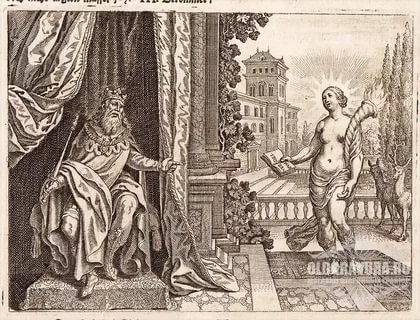

Etiqueta: engraving
Archivo: i - 7.jpeg
Ruta: art_dataset/dataset/dataset_updated/training_set/engraving/i - 7.jpeg



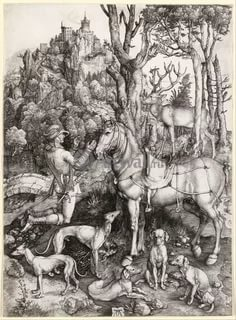

Etiqueta: engraving
Archivo: i - 3.jpeg
Ruta: art_dataset/dataset/dataset_updated/training_set/engraving/i - 3.jpeg



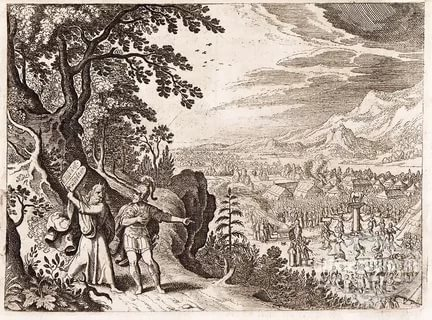

Etiqueta: engraving
Archivo: i - 1.jpeg
Ruta: art_dataset/dataset/dataset_updated/training_set/engraving/i - 1.jpeg



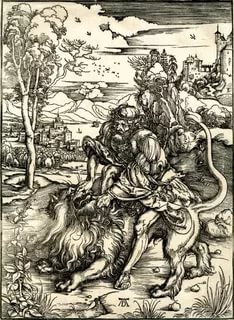

Etiqueta: engraving
Archivo: i - 9.jpeg
Ruta: art_dataset/dataset/dataset_updated/training_set/engraving/i - 9.jpeg



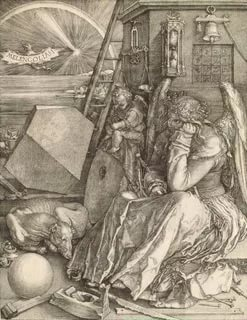

Etiqueta: engraving
Archivo: i - 5.jpeg
Ruta: art_dataset/dataset/dataset_updated/training_set/engraving/i - 5.jpeg



In [ ]:
# Mostrar resultados con imágenes (en Google Colab)
query = "iconographic engraving"
resultados = buscar_arte(query)

for _, row in resultados.iterrows():
    display(Image(filename=row['filepath']))
    print(f"Etiqueta: {row['label']}\nArchivo: {row['filename']}\nRuta: {row['filepath']}\n")

In [ ]:
# Mostrar resultados visualmente
def mostrar_resultados(consulta):
    resultados = buscar_arte(consulta, top_n=5)
    for _, row in resultados.iterrows():
        display(Image(filename=row['filepath']))
        print(f"Etiqueta: {row['label']}\nArchivo: {row['filename']}\nRuta: {row['filepath']}\n")
    print(f"\n🔎 Relevancia aproximada: {relevancia(consulta, resultados):.2f}")


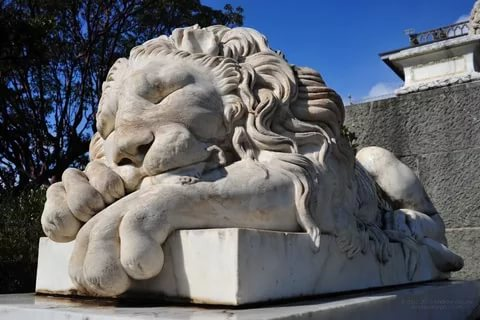

Etiqueta: sculpture
Archivo: i - 4.jpeg
Ruta: art_dataset/dataset/dataset_updated/training_set/sculpture/i - 4.jpeg



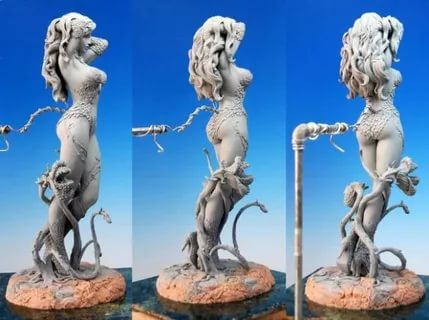

Etiqueta: sculpture
Archivo: i - 7.jpeg
Ruta: art_dataset/dataset/dataset_updated/training_set/sculpture/i - 7.jpeg



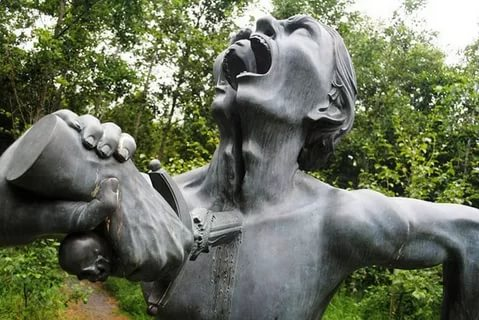

Etiqueta: sculpture
Archivo: i - 6.jpeg
Ruta: art_dataset/dataset/dataset_updated/training_set/sculpture/i - 6.jpeg



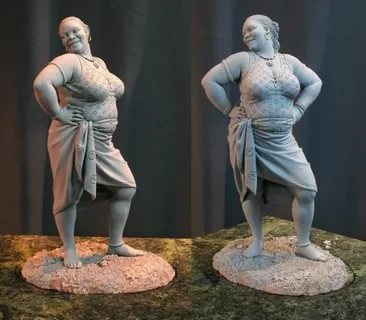

Etiqueta: sculpture
Archivo: i - 9.jpeg
Ruta: art_dataset/dataset/dataset_updated/training_set/sculpture/i - 9.jpeg



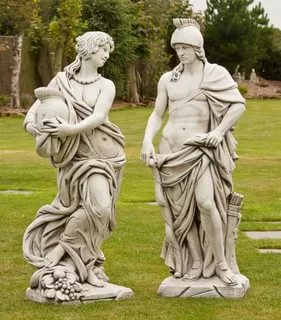

Etiqueta: sculpture
Archivo: i.jpeg
Ruta: art_dataset/dataset/dataset_updated/training_set/sculpture/i.jpeg


🔎 Relevancia aproximada: 1.00


In [ ]:
# interfaz interactiva en colab

output.register_callback('notebook.buscar_arte', mostrar_resultados)

def interfaz_colab():
    html_code = """
    <h3>🔍 Buscador de referencias artísticas</h3>
    <input type="text" id="consulta" placeholder="Ej: painting, sculpture, iconography..." style="width:300px; padding:5px;">
    <button onclick="buscar()">Buscar</button>
    <script>
    function buscar() {
        var consulta = document.getElementById('consulta').value;
        google.colab.kernel.invokeFunction('notebook.buscar_arte', [consulta], {});
    }
    </script>
    """
    display(HTML(html_code))

interfaz_colab()


In [ ]:
import sqlite3

conn = sqlite3.connect('arte.db')
df.to_sql('imagenes', conn, if_exists='replace', index=False)

# Consulta ejemplo:
pd.read_sql_query("SELECT * FROM imagenes WHERE label LIKE '%engraving%'", conn).head()


,filename,filepath,label,text
0,i - 404.jpeg,art_dataset/dataset/dataset_updated/training_s...,engraving,engraving i - 404.jpeg
1,i - 182.jpeg,art_dataset/dataset/dataset_updated/training_s...,engraving,engraving i - 182.jpeg
2,343.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,engraving 343.jpg
3,350.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,engraving 350.jpg
4,i - 380.jpeg,art_dataset/dataset/dataset_updated/training_s...,engraving,engraving i - 380.jpeg


In [ ]:
import os
import pandas as pd
import sqlite3
from IPython.display import display

# === 1. Reconstruir tu DataFrame desde la estructura de carpetas ===
base_path = "art_dataset/dataset/dataset_updated/training_set"

data = []
for class_name in os.listdir(base_path):
    class_path = os.path.join(base_path, class_name)
    if os.path.isdir(class_path):
        for img_file in os.listdir(class_path):
            if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(class_path, img_file)
                data.append({
                    "filename": img_file,
                    "filepath": img_path,
                    "label": class_name,
                    "text": f"{class_name} {img_file}"
                })

df = pd.DataFrame(data)
print(f"✅ DataFrame cargado con {len(df)} filas. Etiquetas únicas: {df['label'].unique()}")

✅ DataFrame cargado con 7819 filas. Etiquetas únicas: ['sculpture' 'painting' 'drawings' 'iconography' 'engraving']


In [ ]:
# === 2. Conectar y crear la base SQLite normalizada con FTS5 ===
db_path = "arte_normalizado.db"
conn = sqlite3.connect(db_path)
cursor = conn.cursor()
cursor.execute("PRAGMA foreign_keys=ON;")

# Crear esquema (categorías, imágenes, FTS y triggers)
cursor.executescript("""
CREATE TABLE IF NOT EXISTS Categoria (
    id_categoria INTEGER PRIMARY KEY AUTOINCREMENT,
    nombre TEXT UNIQUE NOT NULL
);

CREATE TABLE IF NOT EXISTS Imagen (
    id_imagen INTEGER PRIMARY KEY AUTOINCREMENT,
    filename TEXT NOT NULL,
    filepath TEXT NOT NULL,
    id_categoria INTEGER NOT NULL,
    texto_busqueda TEXT,
    FOREIGN KEY (id_categoria) REFERENCES Categoria(id_categoria)
);

CREATE VIRTUAL TABLE IF NOT EXISTS ImagenFTS USING fts5(
    filename,
    filepath,
    texto_busqueda,
    content='Imagen',
    content_rowid='id_imagen'
);

CREATE TRIGGER IF NOT EXISTS imagen_ai AFTER INSERT ON Imagen BEGIN
  INSERT INTO ImagenFTS(rowid, filename, filepath, texto_busqueda)
  VALUES (new.id_imagen, new.filename, new.filepath, new.texto_busqueda);
END;

CREATE TRIGGER IF NOT EXISTS imagen_au AFTER UPDATE ON Imagen BEGIN
  INSERT INTO ImagenFTS(ImagenFTS, rowid, filename, filepath, texto_busqueda)
  VALUES('delete', old.id_imagen, old.filename, old.filepath, old.texto_busqueda);
  INSERT INTO ImagenFTS(rowid, filename, filepath, texto_busqueda)
  VALUES (new.id_imagen, new.filename, new.filepath, new.texto_busqueda);
END;

CREATE TRIGGER IF NOT EXISTS imagen_ad AFTER DELETE ON Imagen BEGIN
  INSERT INTO ImagenFTS(ImagenFTS, rowid, filename, filepath, texto_busqueda)
  VALUES('delete', old.id_imagen, old.filename, old.filepath, old.texto_busqueda);
END;
""")
conn.commit()

In [ ]:
# === 3. Poblar categorías y obtener mapeo ===
for lbl in df["label"].unique():
    cursor.execute("INSERT OR IGNORE INTO Categoria (nombre) VALUES (?)", (lbl,))
conn.commit()

cat_df = pd.read_sql_query("SELECT id_categoria, nombre FROM Categoria", conn)
label_to_id = dict(zip(cat_df["nombre"], cat_df["id_categoria"]))

In [ ]:
# === 4. Insertar imágenes (los triggers mantienen FTS sincronizado) ===
for _, row in df.iterrows():
    texto = f"{row['label']} {row['filename']}"
    cursor.execute("""
        INSERT INTO Imagen (filename, filepath, id_categoria, texto_busqueda)
        VALUES (?,?,?,?)
    """, (row["filename"], row["filepath"], label_to_id[row["label"]], texto))
conn.commit()

In [ ]:
# === 5. Función de búsqueda con FTS ===
def buscar_sql(query_text, top_n=5):
    sql = """
    SELECT i.id_imagen, i.filename, i.filepath, c.nombre AS etiqueta,
           bm25(ImagenFTS) AS score
    FROM ImagenFTS
    JOIN Imagen i ON ImagenFTS.rowid = i.id_imagen
    JOIN Categoria c ON i.id_categoria = c.id_categoria
    WHERE ImagenFTS MATCH ?
    ORDER BY score
    LIMIT ?;
    """
    return pd.read_sql_query(sql, conn, params=(query_text, top_n))

In [ ]:
# === 6. Pruebas ===
# a) Buscar por etiqueta/texto
resultado = buscar_sql("engraving", top_n=5)
print("🔎 Resultados de búsqueda FTS para 'engraving':")
display(resultado)

# b) Conteo por etiqueta
conteo_etiquetas = pd.read_sql_query("""
SELECT c.nombre AS etiqueta, COUNT(*) AS cantidad
FROM Imagen i
JOIN Categoria c ON i.id_categoria = c.id_categoria
GROUP BY c.nombre
ORDER BY cantidad DESC;
""", conn)
print("📦 Cantidad de imágenes por etiqueta:")
display(conteo_etiquetas)

🔎 Resultados de búsqueda FTS para 'engraving':


,id_imagen,filename,filepath,etiqueta,score
0,7062,343.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,-3.166149
1,7063,350.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,-3.166149
2,7066,87.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,-3.166149
3,7067,6.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,-3.166149
4,7068,162.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,-3.166149


📦 Cantidad de imágenes por etiqueta:


,etiqueta,cantidad
0,painting,2128
1,iconography,2079
2,sculpture,1745
3,drawings,1107
4,engraving,760


In [ ]:
pd.read_sql_query("SELECT name FROM sqlite_master WHERE type='table';", conn)

,name
0,Categoria
1,sqlite_sequence
2,Imagen
3,ImagenFTS
4,ImagenFTS_data
5,ImagenFTS_idx
6,ImagenFTS_docsize
7,ImagenFTS_config


In [ ]:
pd.read_sql_query("SELECT name, sql FROM sqlite_master WHERE type='table';", conn)

,name,sql
0,Categoria,CREATE TABLE Categoria (\n id_categoria INT...
1,sqlite_sequence,"CREATE TABLE sqlite_sequence(name,seq)"
2,Imagen,CREATE TABLE Imagen (\n id_imagen INTEGER P...
3,ImagenFTS,CREATE VIRTUAL TABLE ImagenFTS USING fts5(\n ...
4,ImagenFTS_data,CREATE TABLE 'ImagenFTS_data'(id INTEGER PRIMA...
5,ImagenFTS_idx,"CREATE TABLE 'ImagenFTS_idx'(segid, term, pgno..."
6,ImagenFTS_docsize,CREATE TABLE 'ImagenFTS_docsize'(id INTEGER PR...
7,ImagenFTS_config,"CREATE TABLE 'ImagenFTS_config'(k PRIMARY KEY,..."


In [ ]:
# Listar nombres de tablas
print(pd.read_sql_query("SELECT name FROM sqlite_master WHERE type='table';", conn))

                name
0          Categoria
1    sqlite_sequence
2             Imagen
3          ImagenFTS
4     ImagenFTS_data
5      ImagenFTS_idx
6  ImagenFTS_docsize
7   ImagenFTS_config


In [ ]:
# Ver DDL (cómo se crearon)
print(pd.read_sql_query("SELECT name, sql FROM sqlite_master WHERE type='table';", conn))

                name                                                sql
0          Categoria  CREATE TABLE Categoria (\n    id_categoria INT...
1    sqlite_sequence             CREATE TABLE sqlite_sequence(name,seq)
2             Imagen  CREATE TABLE Imagen (\n    id_imagen INTEGER P...
3          ImagenFTS  CREATE VIRTUAL TABLE ImagenFTS USING fts5(\n  ...
4     ImagenFTS_data  CREATE TABLE 'ImagenFTS_data'(id INTEGER PRIMA...
5      ImagenFTS_idx  CREATE TABLE 'ImagenFTS_idx'(segid, term, pgno...
6  ImagenFTS_docsize  CREATE TABLE 'ImagenFTS_docsize'(id INTEGER PR...
7   ImagenFTS_config  CREATE TABLE 'ImagenFTS_config'(k PRIMARY KEY,...


In [ ]:
# Crear vista si no existe
cursor.execute("""
CREATE VIEW IF NOT EXISTS VistaImagenes AS
SELECT i.id_imagen, i.filename, i.filepath, c.nombre AS etiqueta, i.texto_busqueda
FROM Imagen i
JOIN Categoria c ON i.id_categoria = c.id_categoria;
""")
conn.commit()

# Consultar la vista
display(pd.read_sql_query("SELECT * FROM VistaImagenes LIMIT 10;", conn))


,id_imagen,filename,filepath,etiqueta,texto_busqueda
0,1,i - 404.jpeg,art_dataset/dataset/dataset_updated/training_s...,sculpture,sculpture i - 404.jpeg
1,2,i - 182.jpeg,art_dataset/dataset/dataset_updated/training_s...,sculpture,sculpture i - 182.jpeg
2,3,i - 402.jpeg,art_dataset/dataset/dataset_updated/training_s...,sculpture,sculpture i - 402.jpeg
3,4,i - 75.jpeg,art_dataset/dataset/dataset_updated/training_s...,sculpture,sculpture i - 75.jpeg
4,5,415.png,art_dataset/dataset/dataset_updated/training_s...,sculpture,sculpture 415.png
5,6,219 18.59.45.jpg,art_dataset/dataset/dataset_updated/training_s...,sculpture,sculpture 219 18.59.45.jpg
6,7,i (23).jpeg,art_dataset/dataset/dataset_updated/training_s...,sculpture,sculpture i (23).jpeg
7,8,i - 845.jpeg,art_dataset/dataset/dataset_updated/training_s...,sculpture,sculpture i - 845.jpeg
8,9,i108.jpeg,art_dataset/dataset/dataset_updated/training_s...,sculpture,sculpture i108.jpeg
9,10,i - 1390.jpeg,art_dataset/dataset/dataset_updated/training_s...,sculpture,sculpture i - 1390.jpeg


In [ ]:
# Búsqueda de prefijo (ejemplo: todos los que empiecen con "engr")
resultado_prefijo = buscar_sql("engr*", top_n=5)  # usa wildcard de FTS5
display(resultado_prefijo)

,id_imagen,filename,filepath,etiqueta,score
0,7062,343.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,-3.166149
1,7063,350.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,-3.166149
2,7066,87.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,-3.166149
3,7067,6.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,-3.166149
4,7068,162.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,-3.166149


In [ ]:
# Búsqueda con múltiples términos (OR implícito o explícito)
resultado_or = pd.read_sql_query("""
SELECT i.id_imagen, i.filename, i.filepath, c.nombre AS etiqueta, bm25(ImagenFTS) AS score
FROM ImagenFTS
JOIN Imagen i ON ImagenFTS.rowid = i.id_imagen
JOIN Categoria c ON i.id_categoria = c.id_categoria
WHERE ImagenFTS MATCH ?
ORDER BY score
LIMIT 5;
""", conn, params=("engraving OR painting",))
display(resultado_or)

,id_imagen,filename,filepath,etiqueta,score
0,7062,343.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,-3.166149
1,7063,350.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,-3.166149
2,7066,87.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,-3.166149
3,7067,6.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,-3.166149
4,7068,162.jpg,art_dataset/dataset/dataset_updated/training_s...,engraving,-3.166149


In [ ]:
# Mostrar N imágenes aleatorias de una categoría específica
categoria = "engraving"
random_sample = pd.read_sql_query("""
SELECT i.filename, i.filepath
FROM Imagen i
JOIN Categoria c ON i.id_categoria = c.id_categoria
WHERE c.nombre = ?
ORDER BY RANDOM()
LIMIT 5;
""", conn, params=(categoria,))
display(random_sample)

,filename,filepath
0,18.jpg,art_dataset/dataset/dataset_updated/training_s...
1,i - 445.jpeg,art_dataset/dataset/dataset_updated/training_s...
2,i - 356.jpeg,art_dataset/dataset/dataset_updated/training_s...
3,i - 62.jpeg,art_dataset/dataset/dataset_updated/training_s...
4,348.jpg,art_dataset/dataset/dataset_updated/training_s...


In [ ]:
# Cantidad total de imágenes
total_imgs = pd.read_sql_query("SELECT COUNT(*) AS total FROM Imagen;", conn)
display(total_imgs)

# Cantidad de categorías
total_cats = pd.read_sql_query("SELECT COUNT(*) AS total FROM Categoria;", conn)
display(total_cats)

,total
0,7819


,total
0,5


In [ ]:
query = """
SELECT c.nombre AS etiqueta,
       COUNT(*) AS cantidad,
       i.filename AS imagen,
       ROUND(AVG(LENGTH(i.filename)), 2) AS promedio_largo_nombre,
       MIN(LENGTH(i.filename)) AS min_largo,
       MAX(LENGTH(i.filename)) AS max_largo
FROM Imagen i
JOIN Categoria c ON i.id_categoria = c.id_categoria
GROUP BY c.nombre
ORDER BY promedio_largo_nombre DESC;
"""
display(pd.read_sql_query(query, conn))


,etiqueta,cantidad,imagen,promedio_largo_nombre,min_largo,max_largo
0,drawings,1107,01dee7c857692cce250fcc7fba309f3f.jpg,12.85,6,36
1,sculpture,1745,184 18.59.45 20.26.46.jpg,11.92,5,25
2,iconography,2079,345 18.59.20 20.26.19.jpg,10.93,5,25
3,engraving,760,3318_mainfoto_05.jpg,10.48,5,20
4,painting,2128,0685 20.26.31.jpg,8.05,8,17


In [ ]:
# Chequear imágenes duplicadas por nombre (si las hubiera)
query = """
SELECT filename, COUNT(*) as repeticiones
FROM Imagen
GROUP BY filename
HAVING repeticiones > 1;
"""
display(pd.read_sql_query(query, conn))


,filename,repeticiones
0,10.jpg,2
1,100.jpg,2
2,101.jpg,2
3,102.jpg,3
4,103.jpg,2
...,...,...
1659,i - 996.jpeg,3
1660,i - 997.jpeg,3
1661,i - 998.jpeg,2
1662,i - 999.jpeg,2


Como se puede observar, hay varias imagenes repetidas, esto nos dice que el dataset no sera muy util para modelos mas avanzados como por ejemplo redes neuronales por su poca cantidad de registros y su gran cantidad de imagenes repetidas.

In [ ]:
# Ver categorías con menos de 100 imágenes
query = """
SELECT c.nombre AS etiqueta, COUNT(*) AS cantidad
FROM Imagen i
JOIN Categoria c ON i.id_categoria = c.id_categoria
GROUP BY c.nombre
HAVING cantidad < 100
ORDER BY cantidad ASC;
"""
display(pd.read_sql_query(query, conn))


,etiqueta,cantidad


Esto nos dice que el dataset no tiene categorias con menos de 100 imagenes.

In [ ]:
# Cantidad total y porcentaje por categoría
total = pd.read_sql_query("SELECT COUNT(*) as total FROM Imagen;", conn).iloc[0, 0]

query = f"""
SELECT c.nombre AS categoria,
       COUNT(*) AS cantidad,
       ROUND(100.0 * COUNT(*) / {total}, 2) AS porcentaje
FROM Imagen i
JOIN Categoria c ON i.id_categoria = c.id_categoria
GROUP BY c.nombre
ORDER BY cantidad DESC;
"""
df_categoria_porcentaje = pd.read_sql_query(query, conn)
display(df_categoria_porcentaje)


,categoria,cantidad,porcentaje
0,painting,2128,27.22
1,iconography,2079,26.59
2,sculpture,1745,22.32
3,drawings,1107,14.16
4,engraving,760,9.72


## Parte 2 Mini-App final.

### Carga de Datos

In [ ]:
# Conectar con Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Descomprimir las imágenes de APDDv2-images.zip
!unzip -q "/content/drive/MyDrive/Colab Notebooks/APDDv2/APDDv2-images.zip" -d /content/apddv2_images

In [ ]:
# Cargar el CSV de APDDv2-10023.csv
import pandas as pd

# Intenta leer usando una codificación alternativa (latin1)
df_apdd = pd.read_csv(
    "/content/drive/MyDrive/Colab Notebooks/APDDv2/APDDv2-10023.csv",
    encoding="latin1"  # alternativa: encoding="ISO-8859-1" o encoding="cp1252"
)

# Limpiar nombres de columnas
df_apdd.columns = df_apdd.columns.str.strip()

# Renombrar columnas clave
df_apdd.rename(columns={
    "Artistic Categories": "category",
    "Language Comment": "comment",
    "filename": "filename"
}, inplace=True)

# Ver los primeros registros
df_apdd.head()

,filename,category,Total aesthetic score,Theme and logic,Creativity,Layout and composition,Space and perspective,The sense of order,Light and shadow,Color,Details and texture,The overall,Mood,comment
0,0000d0cd38984fffb2c04f964edc9c88.png,traditional Chinese painting*meticulous*mounta...,65.83,7.17,NaN,6.00,5.83,6.00,6.17,5.67,6.50,6.50,6.67,The composition of the picture is rigid and la...
1,000ce20bcec24f29815a9496bf314c11.jpg,sketching*classicism*still life,60.71,5.71,NaN,6.71,6.43,5.71,5.71,NaN,5.14,5.86,6.00,"Each side of the picture is good, making it a ..."
2,000d472bde3c4f4c8dc9f66fede4d463.jpg,oil painting*romanticism*landscapes,65.00,6.20,5.6,6.20,NaN,6.80,NaN,6.60,6.40,6.60,6.40,NaN
3,00122f4a71a847a4b076756dbbf7b349.jpg,oil painting*symbolism*still life,82.86,8.29,NaN,8.29,8.57,8.00,8.29,8.29,8.14,8.14,8.57,NaN
4,00148cf2d7134849872279e21131540c.png,traditional Chinese painting*meticulous*mounta...,66.67,7.67,NaN,6.67,7.00,6.67,7.17,7.00,7.00,6.67,6.17,"The composition is full, the details are rich,..."


In [ ]:
# Unir los datos con las imágenes
import os

# Ruta base donde están las imágenes descomprimidas
image_dir = "/content/apddv2_images"

# Crear una nueva columna con la ruta completa de cada imagen, sin modificar 'filename'
df_apdd['image_path'] = df_apdd['filename'].apply(lambda fname: os.path.join(image_dir, fname))

# (Opcional) Verificar si el archivo realmente existe
df_apdd['image_exists'] = df_apdd['image_path'].apply(os.path.exists)

# Mostrar algunos ejemplos
df_apdd[['filename', 'image_path', 'image_exists']].head()


,filename,image_path,image_exists
0,0000d0cd38984fffb2c04f964edc9c88.png,/content/apddv2_images/0000d0cd38984fffb2c04f9...,True
1,000ce20bcec24f29815a9496bf314c11.jpg,/content/apddv2_images/000ce20bcec24f29815a949...,True
2,000d472bde3c4f4c8dc9f66fede4d463.jpg,/content/apddv2_images/000d472bde3c4f4c8dc9f66...,True
3,00122f4a71a847a4b076756dbbf7b349.jpg,/content/apddv2_images/00122f4a71a847a4b076756...,True
4,00148cf2d7134849872279e21131540c.png,/content/apddv2_images/00148cf2d7134849872279e...,True


### Exploración de datos

In [ ]:
# Tamaño del dataset
print("Número de filas y columnas:", df_apdd.shape)

# Primeras filas
df_apdd.head()

Número de filas y columnas: (10023, 16)


,filename,category,Total aesthetic score,Theme and logic,Creativity,Layout and composition,Space and perspective,The sense of order,Light and shadow,Color,Details and texture,The overall,Mood,comment,image_path,image_exists
0,0000d0cd38984fffb2c04f964edc9c88.png,traditional Chinese painting*meticulous*mounta...,65.83,7.17,NaN,6.00,5.83,6.00,6.17,5.67,6.50,6.50,6.67,The composition of the picture is rigid and la...,/content/apddv2_images/0000d0cd38984fffb2c04f9...,True
1,000ce20bcec24f29815a9496bf314c11.jpg,sketching*classicism*still life,60.71,5.71,NaN,6.71,6.43,5.71,5.71,NaN,5.14,5.86,6.00,"Each side of the picture is good, making it a ...",/content/apddv2_images/000ce20bcec24f29815a949...,True
2,000d472bde3c4f4c8dc9f66fede4d463.jpg,oil painting*romanticism*landscapes,65.00,6.20,5.6,6.20,NaN,6.80,NaN,6.60,6.40,6.60,6.40,NaN,/content/apddv2_images/000d472bde3c4f4c8dc9f66...,True
3,00122f4a71a847a4b076756dbbf7b349.jpg,oil painting*symbolism*still life,82.86,8.29,NaN,8.29,8.57,8.00,8.29,8.29,8.14,8.14,8.57,NaN,/content/apddv2_images/00122f4a71a847a4b076756...,True
4,00148cf2d7134849872279e21131540c.png,traditional Chinese painting*meticulous*mounta...,66.67,7.67,NaN,6.67,7.00,6.67,7.17,7.00,7.00,6.67,6.17,"The composition is full, the details are rich,...",/content/apddv2_images/00148cf2d7134849872279e...,True


El dataset es de tamaño considerable, con más de 10.000 muestras y 16 columnas. Esto sugiere un buen volumen de datos para realizar análisis estadísticos y construir modelos. Es un tamaño adecuado para entrenamiento y validación sin riesgo de sobreajuste inmediato.

La muestra revela que cada imagen está acompañada de:

- Un nombre de archivo, su ruta y un image_exists para verificar su existencia.
- Una categoría jerárquica compuesta por técnica, estilo y temática (técnica*estilo*tema).
- Una puntuación estética total y varias subdimensiones evaluadas numéricamente.
- Un campo comment con comentarios sobre las obras

Esto confirma que el dataset combina tanto datos cuantitativos como cualitativos, lo que permite desarrollar tareas tanto de análisis numérico como de procesamiento de lenguaje natural (PLN).



In [ ]:
# Ver las columnas y tipos de datos
df_apdd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10023 entries, 0 to 10022
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   filename                10023 non-null  object 
 1   category                10023 non-null  object 
 2   Total aesthetic score   10023 non-null  float64
 3   Theme and logic         7964 non-null   float64
 4   Creativity              3819 non-null   float64
 5   Layout and composition  10023 non-null  float64
 6   Space and perspective   6204 non-null   float64
 7   The sense of order      7964 non-null   float64
 8   Light and shadow        6204 non-null   float64
 9   Color                   6201 non-null   float64
 10  Details and texture     10023 non-null  float64
 11  The overall             10023 non-null  float64
 12  Mood                    6736 non-null   float64
 13  comment                 4906 non-null   object 
 14  image_path              10023 non-null

- Las columnas como **Creativity**, **Mood** y varias otras tienen muchos valores faltantes, siendo **Creativity** la más incompleta con más del 60% de datos nulos. lo que hace de estas columnas muy poco utiles en analisis u modelos.
- Por otro lado, columnas clave como **Total aesthetic score**, **Layout and composition**, **The overall** y **Details and texture** están completas.

Esto sugiere quese puede usar solo las columnas completas para análisis generales o modelos simples, o tambien, diseñar estrategias para imputar los valores faltantes (e.g., usando la media por categoría), pero dado el tipo de dataset no creo que sea la mejor opción.

También resalta que los tipos de datos están bien definidos (float64, object, bool), por lo que no se requieren conversiones inmediatas.

In [ ]:
# Ver valores nulos
df_apdd.isnull().sum()

,0
filename,0
category,0
Total aesthetic score,0
Theme and logic,2059
Creativity,6204
Layout and composition,0
Space and perspective,3819
The sense of order,2059
Light and shadow,3819
Color,3822


Este resumen confirma la presencia de **más de 6.000 valores faltantes en "Creativity" y cerca de 3.000 en "Mood" y las demás subdimensiones**. El campo **comment** también tiene **más del 50% de valores nulos**, lo cual puede afectar el análisis textual si no se filtra previamente.

Por lo que lo mejor es trabajar primero con las entradas que tienen comentarios para tareas de PLN y excluirlas del análisis cuantitativo si es necesario.

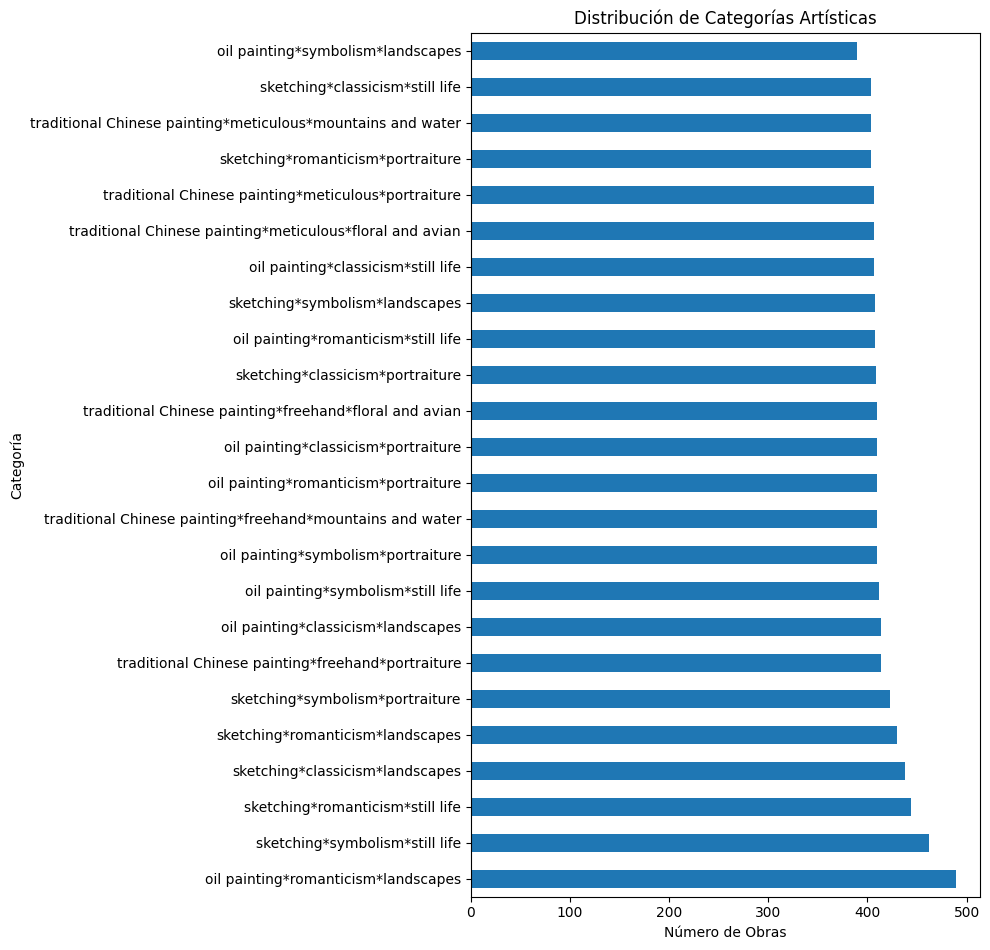

In [ ]:
# Ver distribución de categorías artísticas
import matplotlib.pyplot as plt

# Contar categorías
category_counts = df_apdd['category'].value_counts()

# Crear gráfico de barras horizontales
plt.figure(figsize=(10, len(category_counts) * 0.4))  # altura depende de la cantidad de categorías
category_counts.plot(kind='barh', title='Distribución de Categorías Artísticas')

plt.xlabel('Número de Obras')
plt.ylabel('Categoría')
plt.tight_layout()
plt.show()

Las clases están razonablemente balanceadas, con la categoría más frecuente apenas superando las **490 instancias** y la menos frecuente bordeando las **390**. Esto implica que no hay un desbalance crítico, lo cual es positivo para tareas de clasificación (como predicción de estilo o categoría).


In [ ]:
# Ver cantidad de imagenes perdidas
missing_images = df_apdd[~df_apdd['image_exists']]
print(f"{len(missing_images)} imágenes no fueron encontradas.")


0 imágenes no fueron encontradas.


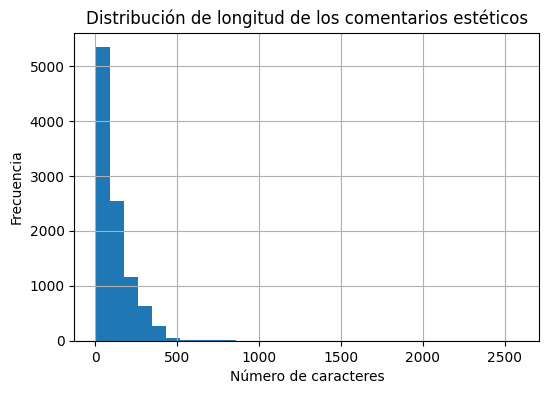

In [ ]:
# Análisis de longitud de los comentarios estéticos (comment)
df_apdd['comment_length'] = df_apdd['comment'].astype(str).apply(len)

plt.figure(figsize=(6,4))
df_apdd['comment_length'].hist(bins=30)
plt.title("Distribución de longitud de los comentarios estéticos")
plt.xlabel("Número de caracteres")
plt.ylabel("Frecuencia")
plt.show()

Más de 9.000 comentarios tienen **menos de 250 caracteres**, lo que indica que la mayoría son anotaciones breves.

Esto es importante para:
- Aplicaciones de PLN ligeras como análisis de sentimiento o similitud semántica.
- También sugiere que un modelo de embeddings puede funcionar bien si se entrena sobre frases cortas.

In [ ]:
# Análisis de puntuaciones estéticas
score_cols = [col for col in df_apdd.columns if "score" in col.lower() or "rating" in col.lower()]
print("Columnas de puntaje:", score_cols)

# Estadísticas descriptivas
df_apdd[score_cols].describe()


Columnas de puntaje: ['Total aesthetic score']


,Total aesthetic score
count,10023.000000
mean,64.284556
std,15.242155
min,10.710000
25%,55.000000
50%,67.500000
75%,75.830000
max,92.860000


Esto indica que hay una buena dispersión de valores, lo que es útil para modelos de regresión. No parece haber sesgo excesivo en la distribución.

Categoría: traditional Chinese painting*meticulous*mountains and water
Comentario: nan


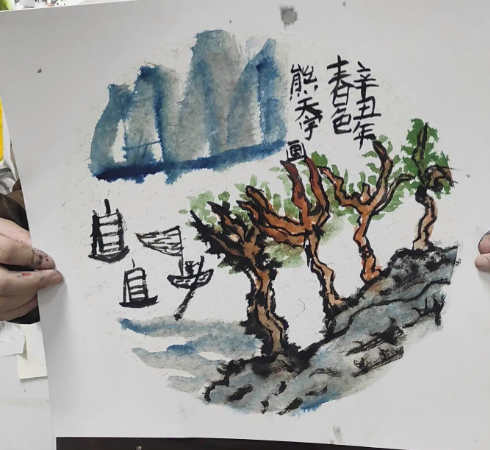


--------------------------------------------------

Categoría: oil painting*symbolism*landscapes
Comentario: The natural scenery is vividly depicted, and the color changes of the sky are rich and full of vitality.


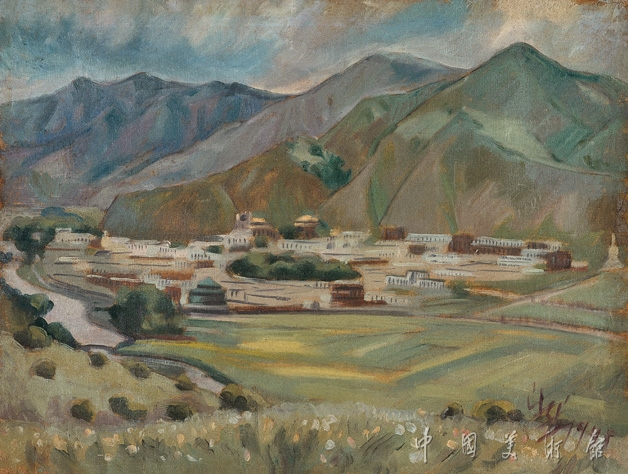


--------------------------------------------------

Categoría: traditional Chinese painting*freehand*portraiture
Comentario: The picture is very delicate, and calligraphy is the finishing touch. Calligraphy and painting complement each other, and the elements in the picture are concise, intuitive, and rich. A good picture. The expressions and movements of the characters are all very good. The overall artistic conception of the picture is good, and the atmosphere is unified


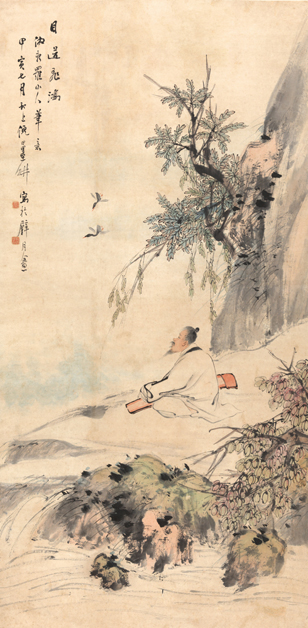


--------------------------------------------------

Categoría: sketching*symbolism*portraiture
Comentario: There are some errors in the character composition, lack of scene portrayal, and some stiff lines


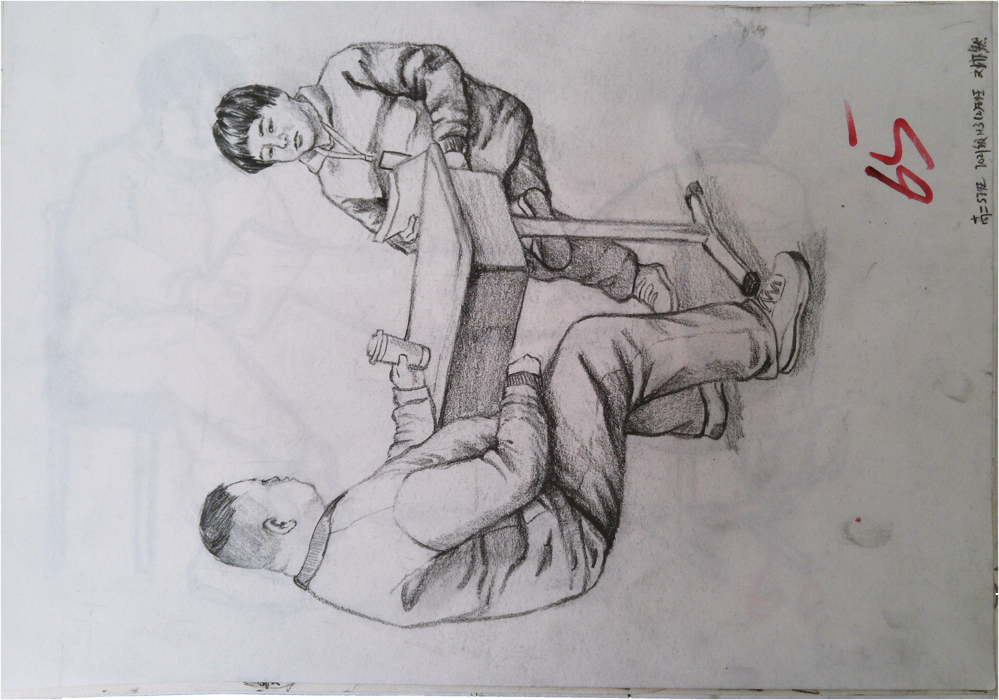


--------------------------------------------------

Categoría: traditional Chinese painting*freehand*mountains and water
Comentario: nan


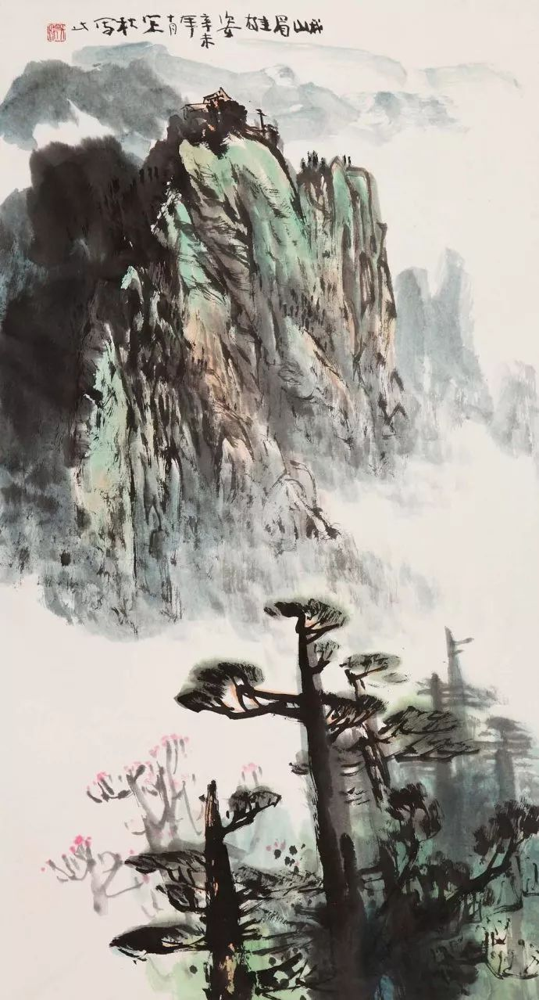


--------------------------------------------------



In [ ]:
# Ver algunas imágenes con sus comentarios y categorías
from IPython.display import Image, display

# Muestra N imágenes aleatorias con su categoría y comentario
def mostrar_imagenes(df, n=5):
    sample = df.sample(n)
    for _, row in sample.iterrows():
        print(f"Categoría: {row['category']}")
        print(f"Comentario: {row['comment']}")
        display(Image(row['image_path']))
        print("\n" + "-"*50 + "\n")

mostrar_imagenes(df_apdd, n=5)

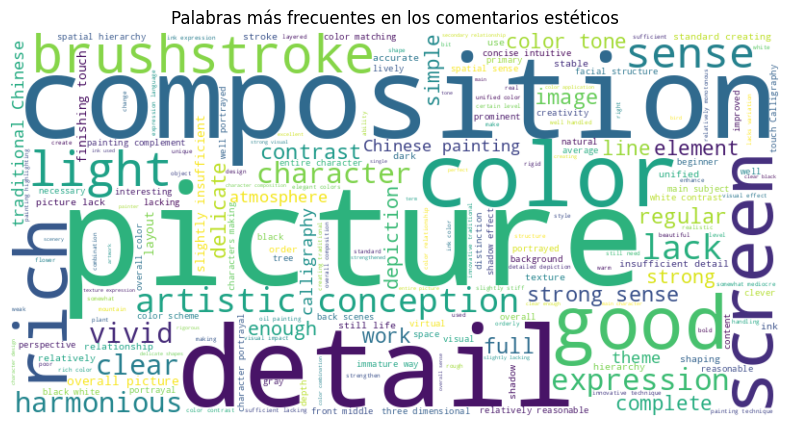

In [ ]:
# Ver palabras más comunes en los comentarios
from collections import Counter
from wordcloud import WordCloud

all_text = " ".join(df_apdd['comment'].dropna().astype(str).tolist())
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)

plt.figure(figsize=(10,5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Palabras más frecuentes en los comentarios estéticos")
plt.show()

### Preprocesamiento de Texto + Vectorización

Para esta etapa se filtraran los comentarios disponibles y luego se realizara limpieza basica del texto.

In [ ]:
# 1. Filtrar los registros que tienen comentarios válidos
df_comments = df_apdd[df_apdd['comment'].notna()].copy()

In [ ]:
# 2. Limpieza básica del texto (puedes agregar más si deseas)
import re

def clean_text(text):
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)  # Eliminar puntuación
    text = re.sub(r'\d+', '', text)      # Eliminar números
    text = text.strip()
    return text

df_comments['comment_clean'] = df_comments['comment'].apply(clean_text)

In [ ]:
# 3. Vectorización con SentenceTransformer
!pip install -q sentence-transformers
from sentence_transformers import SentenceTransformer

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 67.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 36.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 42.8 MB/s eta 0:00:00


In [ ]:
# Cargar el modelo
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
# Obtener los embeddings para cada comentario
comment_embeddings = model.encode(df_comments['comment_clean'].tolist(), show_progress_bar=True)

Batches:   0%|          | 0/154 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)


In [ ]:
# Convertir a matriz numpy y agregar como columnas en un nuevo DataFrame
import numpy as np
embeddings_df = pd.DataFrame(comment_embeddings, index=df_comments.index)

In [ ]:
# Concatenar con el DataFrame original para unir texto + vector
df_vectorized = pd.concat([df_comments.reset_index(drop=True), embeddings_df.reset_index(drop=True)], axis=1)

In [ ]:
# Resultado parcial
df_vectorized.head(4)

,filename,category,Total aesthetic score,Theme and logic,Creativity,Layout and composition,Space and perspective,The sense of order,Light and shadow,Color,...,374,375,376,377,378,379,380,381,382,383
0,0000d0cd38984fffb2c04f964edc9c88.png,traditional Chinese painting*meticulous*mounta...,65.83,7.17,NaN,6.00,5.83,6.00,6.17,5.67,...,0.035557,-0.083888,-0.001326,0.047159,-0.018006,0.037383,0.033571,0.023574,0.010806,-0.003848
1,000ce20bcec24f29815a9496bf314c11.jpg,sketching*classicism*still life,60.71,5.71,NaN,6.71,6.43,5.71,5.71,NaN,...,0.052440,0.041867,-0.017606,-0.039278,0.014550,0.064535,-0.008436,0.078199,-0.100493,0.038734
2,00148cf2d7134849872279e21131540c.png,traditional Chinese painting*meticulous*mounta...,66.67,7.67,NaN,6.67,7.00,6.67,7.17,7.00,...,-0.029750,-0.020895,-0.067358,0.089736,-0.017693,0.023859,0.026633,0.054217,-0.029094,-0.022872
3,00165fa1d0024790a045b6f9ab70b437.jpg,sketching*romanticism*landscapes,43.57,4.57,4.57,4.57,NaN,4.43,NaN,NaN,...,0.025537,-0.036181,-0.001415,0.049769,0.053689,-0.038699,0.050938,0.108551,-0.029342,-0.012336


### Búsqueda semántica con entrada del usuario

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)


Categoría: sketching*romanticism*portraiture | Puntuación estética: 34.29 | Similaridad: 0.333


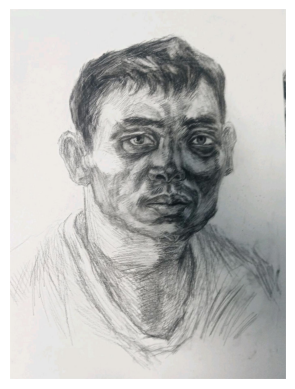

Categoría: oil painting*romanticism*still life | Puntuación estética: 75.0 | Similaridad: 0.322


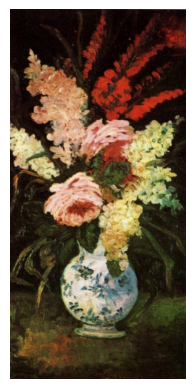

Categoría: oil painting*symbolism*portraiture | Puntuación estética: 69.17 | Similaridad: 0.305


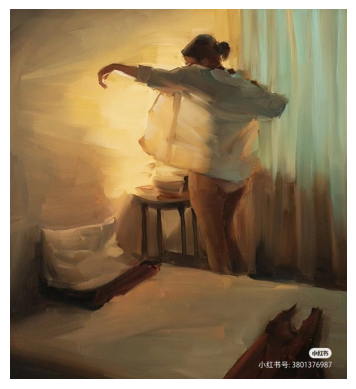

Categoría: oil painting*symbolism*portraiture | Puntuación estética: 79.17 | Similaridad: 0.305


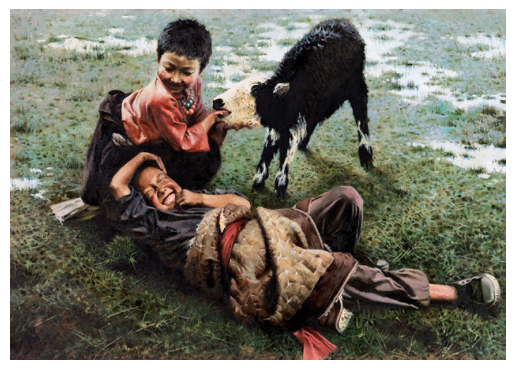

Categoría: oil painting*romanticism*still life | Puntuación estética: 67.86 | Similaridad: 0.305


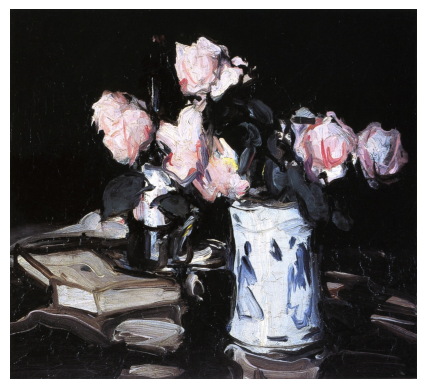

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# 1. Ingresar el texto del usuario
user_input = "paisaje en perspectiva clásica con luz tenue"
user_vector = model.encode([user_input])  # vectorizar input del usuario

# 2. Calcular similitud con todos los vectores del dataset
similarities = cosine_similarity(user_vector, df_vectorized.iloc[:, -384:])[0]

# 3. Obtener los top N resultados
top_n = 5
top_indices = np.argsort(similarities)[::-1][:top_n]

# 4. Mostrar resultados
df_resultados = df_vectorized.iloc[top_indices][['filename', 'category', 'Total aesthetic score']]
df_resultados['similarity'] = similarities[top_indices]

import matplotlib.pyplot as plt
import os
from PIL import Image

# Ruta a las imagenes
image_folder_path = "/content/apddv2_images"

# Mostrar imágenes con información
for i, row in df_resultados.iterrows():
    print(f"Categoría: {row['category']} | Puntuación estética: {row['Total aesthetic score']} | Similaridad: {row['similarity']:.3f}")
    img_path = os.path.join(image_folder_path, row['filename'])

    try:
        img = Image.open(img_path)
        plt.imshow(img)
        plt.axis('off')
        plt.show()
    except Exception as e:
        print(f"Error al cargar imagen: {e}")


In [ ]:
#  Función buscar_referencias_por_texto()
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

def buscar_referencias_por_texto(df, model, image_folder_path, top_n=5):
    # 1. Ingresar texto del usuario
    user_input = input("🔍 Ingresa tu descripción o comentario artístico: ")
    user_vector = model.encode([user_input])

    # 2. Calcular similitud
    similarities = cosine_similarity(user_vector, df.iloc[:, -384:])[0]

    # 3. Obtener los top N resultados
    top_indices = np.argsort(similarities)[::-1][:top_n]

    # 4. Mostrar resultados
    df_resultados = df.iloc[top_indices][['filename', 'category', 'Total aesthetic score']].copy()
    df_resultados['similarity'] = similarities[top_indices]

    # 5. Mostrar imágenes con info
    for i, row in df_resultados.iterrows():
        print(f"📌 Categoría: {row['category']} | ✨ Estética: {row['Total aesthetic score']} | 🔗 Similaridad: {row['similarity']:.3f}")
        img_path = os.path.join(image_folder_path, row['filename'])

        try:
            img = Image.open(img_path)
            plt.imshow(img)
            plt.axis('off')
            plt.show()
        except Exception as e:
            print(f"❌ Error al cargar imagen: {e}")


🔍 Ingresa tu descripción o comentario artístico: some errors in the character composition


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)


📌 Categoría: sketching*symbolism*portraiture | ✨ Estética: 41.67 | 🔗 Similaridad: 0.579


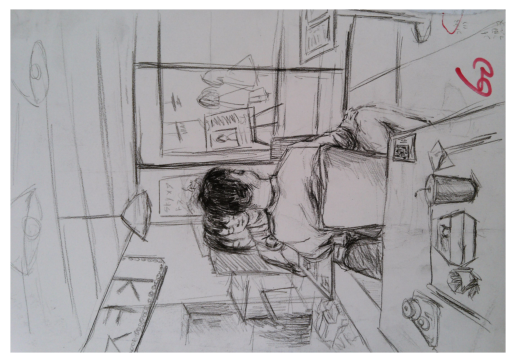

📌 Categoría: sketching*symbolism*portraiture | ✨ Estética: 52.5 | 🔗 Similaridad: 0.579


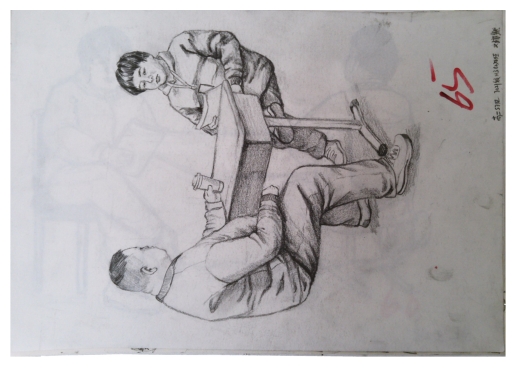

📌 Categoría: sketching*symbolism*portraiture | ✨ Estética: 58.33 | 🔗 Similaridad: 0.513


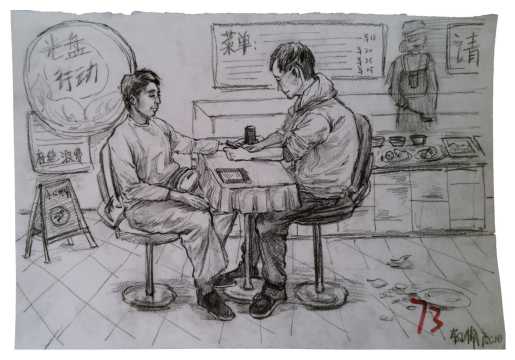

📌 Categoría: sketching*symbolism*portraiture | ✨ Estética: 61.67 | 🔗 Similaridad: 0.513


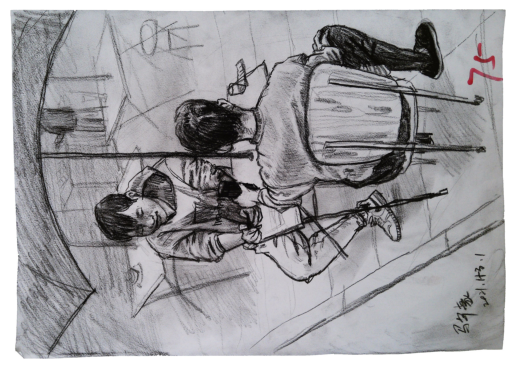

📌 Categoría: sketching*symbolism*portraiture | ✨ Estética: 38.33 | 🔗 Similaridad: 0.513


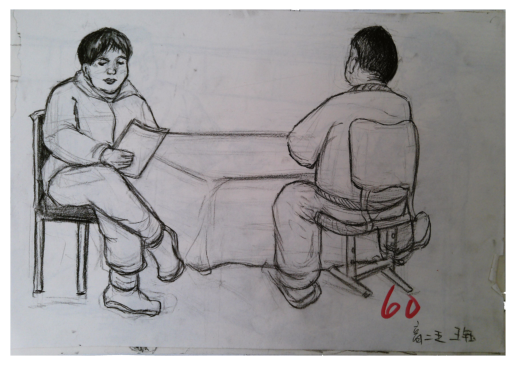

In [ ]:
buscar_referencias_por_texto(df_vectorized, model, "/content/apddv2_images", top_n=5)

Como se puede ver, hay algunos errores, las imagenes sugeridas a partir del comentario que ingresa el usuario no representan al 100% lo que el usuario solicita. Esto me llevo a pensar en la forma en la que funciona la búsqueda semántica, y creo que para que funcione mejor se deverian aprovechar los otros datos que tenemos, asi que ahora lo mejor sera utilizar category de forma mas eficiente, por lo que se separá en 3 columnas. `technique`, `style` y `theme`.

### Separar category en tres columnas usando SQL

In [ ]:
import sqlite3

# Crear base de datos en memoria (o puedes guardar como .db en Drive)
conn = sqlite3.connect(":memory:")

# Subir una versión filtrada del DataFrame original
df_sql = df_apdd[['filename', 'category', 'Total aesthetic score', 'Layout and composition',
                  'The overall', 'Details and texture', 'comment']].copy()

# Subir el DataFrame como tabla
df_sql.to_sql("artworks", conn, index=False, if_exists="replace")

# Crear una nueva tabla con las 3 partes separadas
query_split_category = """
CREATE TABLE artworks_split AS
SELECT *,
       -- Primer elemento antes del primer '*'
       TRIM(SUBSTR(category, 1, INSTR(category, '*') - 1)) AS technique,

       -- Segundo elemento entre el primer y segundo '*'
       TRIM(SUBSTR(
           category,
           INSTR(category, '*') + 1,
           INSTR(SUBSTR(category, INSTR(category, '*') + 1), '*') - 1
       )) AS style,

       -- Tercer elemento después del segundo '*'
       TRIM(SUBSTR(
           category,
           INSTR(category, '*') + 1 + INSTR(SUBSTR(category, INSTR(category, '*') + 1), '*')
       )) AS theme

FROM artworks;
"""
conn.execute(query_split_category)
conn.commit()

# Cargar a pandas para verificar
df_split = pd.read_sql_query("SELECT * FROM artworks_split", conn)
df_split.head()


,filename,category,Total aesthetic score,Layout and composition,The overall,Details and texture,comment,technique,style,theme
0,0000d0cd38984fffb2c04f964edc9c88.png,traditional Chinese painting*meticulous*mounta...,65.83,6.00,6.50,6.50,The composition of the picture is rigid and la...,traditional Chinese painting,meticulous,mountains and water
1,000ce20bcec24f29815a9496bf314c11.jpg,sketching*classicism*still life,60.71,6.71,5.86,5.14,"Each side of the picture is good, making it a ...",sketching,classicism,still life
2,000d472bde3c4f4c8dc9f66fede4d463.jpg,oil painting*romanticism*landscapes,65.00,6.20,6.60,6.40,None,oil painting,romanticism,landscapes
3,00122f4a71a847a4b076756dbbf7b349.jpg,oil painting*symbolism*still life,82.86,8.29,8.14,8.14,None,oil painting,symbolism,still life
4,00148cf2d7134849872279e21131540c.png,traditional Chinese painting*meticulous*mounta...,66.67,6.67,6.67,7.00,"The composition is full, the details are rich,...",traditional Chinese painting,meticulous,mountains and water


### Rehacer la Búsqueda

ahora se usara Sentence-BERT + las columnas numéricas normalizadas para calcular similitud combinada.

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics.pairwise import cosine_similarity

# Normalizar columnas estéticas
cols_esteticas = ['Total aesthetic score', 'Layout and composition', 'The overall', 'Details and texture']
scaler = MinMaxScaler()
scaled_scores = scaler.fit_transform(df_split[cols_esteticas].fillna(0))

# Obtener embeddings limpios
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')
df_split['comment_clean'] = df_split['comment'].fillna('').apply(clean_text)
text_embeddings = model.encode(df_split['comment_clean'].tolist(), show_progress_bar=True)

# Concatenar embeddings + puntuaciones
final_embeddings = np.hstack((text_embeddings, scaled_scores))


Batches:   0%|          | 0/314 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)


In [ ]:
#Funcion de busqueda Mejorada

def buscar_referencias_avanzado(df, embeddings_matrix, model, top_n=5):
    user_input = input("🔍 Describe lo que buscas (ej: 'obra triste con colores apagados'): ")
    input_clean = clean_text(user_input)

    # Embedding del input
    input_vec_text = model.encode([input_clean])

    # Valores neutrales para columnas estéticas
    input_vec_scores = np.array([[0.5]*4])  # Puedes ajustar si el input sugiere algo bajo/alto
    input_vec_full = np.hstack((input_vec_text, input_vec_scores))

    # Similaridad
    similarities = cosine_similarity(input_vec_full, embeddings_matrix)[0]
    top_indices = np.argsort(similarities)[::-1][:top_n]

    for idx in top_indices:
        row = df.iloc[idx]
        print(f"🎨 Técnica: {row['technique']} | Estilo: {row['style']} | Tema: {row['theme']}")
        print(f"✨ Score: {row['Total aesthetic score']} | 📐 Composición: {row['Layout and composition']}")
        print(f"🗣️ Comentario: {row['comment']}")
        img_path = os.path.join("/content/apddv2_images", row['filename'])
        try:
            img = Image.open(img_path)
            plt.imshow(img)
            plt.axis('off')
            plt.show()
        except Exception as e:
            print(f"❌ Error al mostrar imagen: {e}")


In [ ]:
buscar_referencias_avanzado()

### Busqueda basada en TF-IDF

In [ ]:
# Limpiar los textos/comentarios
import re

def clean_text(text):
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)  # Eliminar signos de puntuación
    text = re.sub(r'\d+', '', text)      # Eliminar números
    return text.strip()

df_split['comment_clean'] = df_split['comment'].fillna('').apply(clean_text)


In [ ]:
# Vectorizar con TR-IDF usando TfidVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

# Vectorización TF-IDF
vectorizer = TfidfVectorizer(max_features=1000)
tfidf_matrix = vectorizer.fit_transform(df_split['comment_clean'])


In [ ]:
# Funcion de busqueda con TF-IDF mas Solicitud de Coseno
from sklearn.metrics.pairwise import cosine_similarity

def buscar_referencias_tfidf(df, tfidf_matrix, vectorizer, top_n=5):
    user_input = input("📝 Ingresa tu descripción artística (TF-IDF): ")
    input_clean = clean_text(user_input)

    # Vectorizar input
    input_vec = vectorizer.transform([input_clean])

    # Calcular similitud
    similarities = cosine_similarity(input_vec, tfidf_matrix)[0]
    top_indices = similarities.argsort()[::-1][:top_n]

    # Mostrar resultados
    for idx in top_indices:
        row = df.iloc[idx]
        print(f"🎨 Técnica: {row['technique']} | Estilo: {row['style']} | Tema: {row['theme']}")
        print(f"✨ Score: {row['Total aesthetic score']} | 🗣️ Comentario: {row['comment']}")
        print(f"🔗 Similaridad: {similarities[idx]:.3f}")

        img_path = os.path.join("/content/apddv2_images", row['filename'])
        try:
            img = Image.open(img_path)
            plt.imshow(img)
            plt.axis('off')
            plt.show()
        except Exception as e:
            print(f"❌ Error al mostrar imagen: {e}")


#### Comparacion de los modelos

📝 Ingresa tu descripción artística (TF-IDF): dark depresive
🎨 Técnica: sketching | Estilo: symbolism | Tema: still life
✨ Score: 54.17 | 🗣️ Comentario: The handling of contrast between light and dark is somewhat ordinary, and attention should be paid to the depiction of the boundary between light and dark, strengthening the ability to handle the relationship between light and dark, and the expressive power of light and shadow effects.
🔗 Similaridad: 0.390


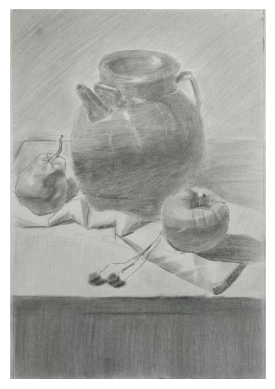

🎨 Técnica: oil painting | Estilo: romanticism | Tema: portraiture
✨ Score: 54.29 | 🗣️ Comentario: The composition of the picture is quite creative, with dark and dim colors and insufficient depth of details.
🔗 Similaridad: 0.343


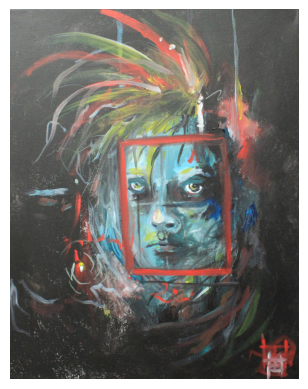

🎨 Técnica: sketching | Estilo: symbolism | Tema: still life
✨ Score: 69.17 | 🗣️ Comentario: The brushstrokes are delicate, but the handling of light and dark relationships appears somewhat ordinary. It is necessary to strengthen the handling of light and dark relationships to enhance the sense of hierarchy in the image.
🔗 Similaridad: 0.330


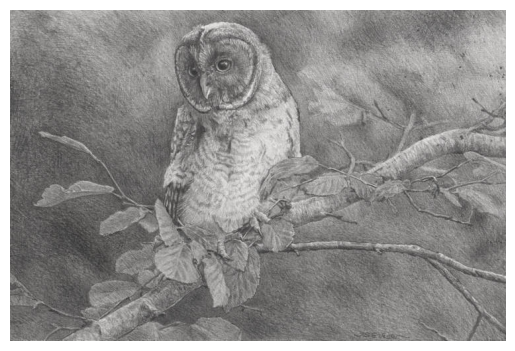

🎨 Técnica: sketching | Estilo: symbolism | Tema: still life
✨ Score: 58.33 | 🗣️ Comentario: The processing of contrast between light and dark in the picture is slightly dull, and it is necessary to strengthen the ability to handle the relationship between light and dark and the expressive power of light and shadow effects.
🔗 Similaridad: 0.325


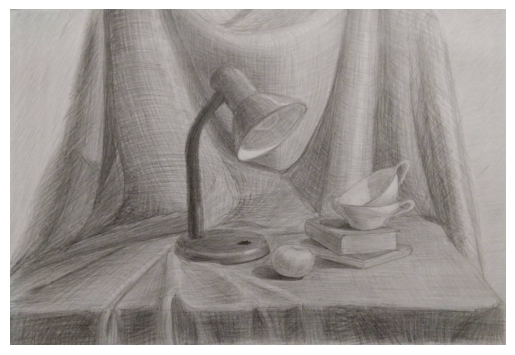

🎨 Técnica: oil painting | Estilo: classicism | Tema: still life
✨ Score: 70.83 | 🗣️ Comentario: Flowers have a strong sense of hierarchy, clear light and dark relationships, and rich colors
🔗 Similaridad: 0.323


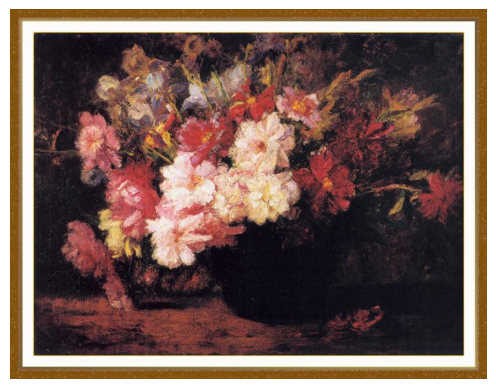

In [ ]:
buscar_referencias_tfidf(df_split, tfidf_matrix, vectorizer)

🔍 Describe lo que buscas (ej: 'obra triste con colores apagados'): dark depresive
🎨 Técnica: sketching | Estilo: symbolism | Tema: still life
✨ Score: 83.33 | 📐 Composición: 8.17
🗣️ Comentario: Properly handling the contrast between light and dark enhances the visual impact of the image. The intensity of the strokes is moderate, with a strong sense of rhythm, making the image both powerful and soft.


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)


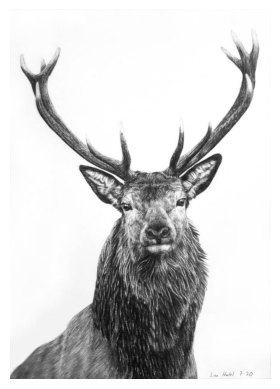

🎨 Técnica: sketching | Estilo: symbolism | Tema: still life
✨ Score: 75.0 | 📐 Composición: 8.0
🗣️ Comentario: Strong contrast, clear theme, vivid and creative visuals. The dark part can increase the sense of hierarchy and change.


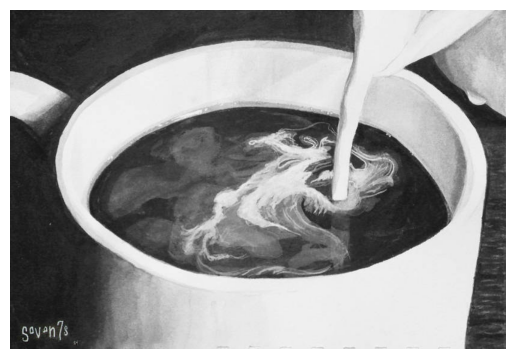

🎨 Técnica: sketching | Estilo: symbolism | Tema: still life
✨ Score: 54.17 | 📐 Composición: 6.0
🗣️ Comentario: The handling of contrast between light and dark is somewhat ordinary, and attention should be paid to the depiction of the boundary between light and dark, strengthening the ability to handle the relationship between light and dark, and the expressive power of light and shadow effects.


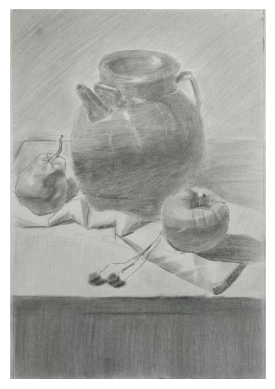

🎨 Técnica: sketching | Estilo: symbolism | Tema: still life
✨ Score: 61.67 | 📐 Composición: 6.17
🗣️ Comentario: The handling of contrast between light and dark is somewhat ordinary, and it is necessary to strengthen the ability to handle the relationship between light and dark as well as the expressive power of light and shadow effects.


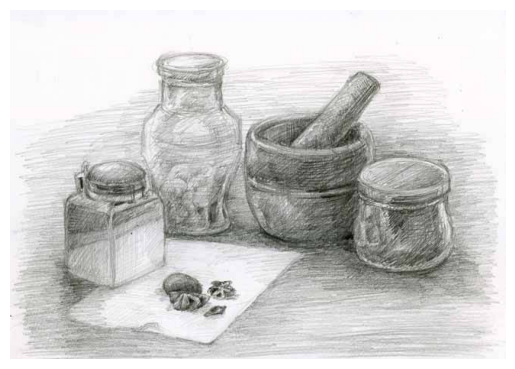

🎨 Técnica: traditional Chinese painting | Estilo: meticulous | Tema: portraiture
✨ Score: 81.67 | 📐 Composición: 7.67
🗣️ Comentario: The picture is quite gloomy, the character portrayal is not very beautiful, the colors are relatively low and not pleasing.


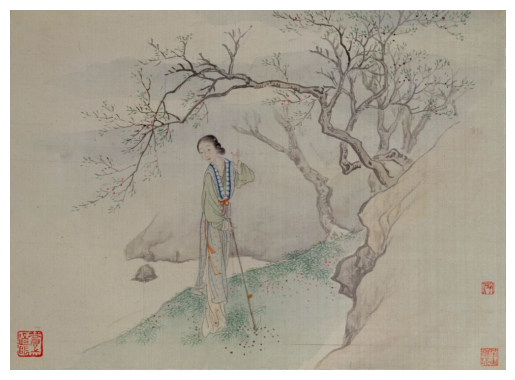

In [ ]:
buscar_referencias_avanzado(df_split, final_embeddings, model)

consulta SQL

In [ ]:
consulta = """
SELECT technique, AVG([Total aesthetic score]) AS avg_score
FROM artworks_split
GROUP BY technique
ORDER BY avg_score DESC
"""
df_tecnica_score = pd.read_sql_query(consulta, conn)
df_tecnica_score.head()


,technique,avg_score
0,oil painting,65.111054
1,traditional Chinese painting,63.859641
2,sketching,63.746447


In [ ]:
#  Promedio de número de comentarios por categoría

consulta = """
SELECT theme, COUNT(*) AS total_comentarios, AVG(LENGTH(comment)) AS promedio_longitud
FROM comment
GROUP BY theme
ORDER BY total_comentarios DESC;
"""
df_promedio_comentarios = pd.read_sql_query(consulta, conn)
df_promedio_comentarios.head()

DatabaseError: Execution failed on sql '
SELECT theme, COUNT(*) AS total_comentarios, AVG(LENGTH(comment)) AS promedio_longitud
FROM comentarios
GROUP BY theme
ORDER BY total_comentarios DESC;
': no such table: comentarios

### interfaz interactiva


In [ ]:
!pip install -q ipywidgets
import ipywidgets as widgets
from IPython.display import display, clear_output

In [ ]:
# Entrada de texto
texto_busqueda = widgets.Text(
    value='obra triste con colores apagados',
    placeholder='Describe lo que buscas',
    description='🔍 Buscar:',
    layout=widgets.Layout(width='600px')
)

# Slider para elegir cuántos resultados mostrar
slider_top_n = widgets.IntSlider(
    value=5,
    min=1,
    max=10,
    step=1,
    description='Top N:',
    continuous_update=False
)

# Desplegables de técnica, estilo o tema (puedes usarlo si lo tienes separado)
dropdown_tecnica = widgets.Dropdown(
    options=['Cualquiera'] + sorted(df_split['technique'].dropna().unique().tolist()),
    description='🎨 Técnica:'
)

# Botón de búsqueda
boton_buscar = widgets.Button(
    description='Buscar referencias',
    button_style='success',
    icon='search'
)


In [ ]:
def on_buscar_click(b):
    clear_output(wait=True)  # Limpia resultados anteriores
    display(ui)  # Muestra nuevamente la interfaz

    # Obtener valores de los widgets
    user_input = texto_busqueda.value
    top_n = slider_top_n.value
    tecnica_filtro = dropdown_tecnica.value

    # Limpiar input
    input_clean = clean_text(user_input)
    input_vec_text = model.encode([input_clean])
    input_vec_scores = np.array([[0.5]*4])  # Neutral
    input_vec_full = np.hstack((input_vec_text, input_vec_scores))

    # Similaridad
    similarities = cosine_similarity(input_vec_full, embeddings_matrix)[0]
    top_indices = np.argsort(similarities)[::-1]

    count = 0
    for idx in top_indices:
        row = df_split.iloc[idx]

        # Filtrar por técnica si se seleccionó
        if tecnica_filtro != 'Cualquiera' and row['technique'] != tecnica_filtro:
            continue

        print(f"🎨 Técnica: {row['technique']} | Estilo: {row['style']} | Tema: {row['theme']}")
        print(f"✨ Total aesthetic score: {row['Total aesthetic score']}")
        print(f"📐 Composición: {row['Layout and composition']} | 🧱 Detalles: {row['Details and texture']}")
        print(f"🗣️ Comentario: {row['comment']}")
        print(f"🔗 Similaridad: {similarities[idx]:.3f}\n")

        # Mostrar imagen
        img_path = os.path.join("/content/apddv2_images", row['filename'])
        try:
            img = Image.open(img_path)
            plt.imshow(img)
            plt.axis('off')
            plt.show()
        except Exception as e:
            print(f"❌ Error al mostrar imagen: {e}")

        count += 1
        if count >= top_n:
            break


In [ ]:
# Suponiendo que tienes una columna con comentarios limpios llamada 'comment_clean'
text_embeddings = model.encode(df_split['comment_clean'].tolist())

# Si estás usando también las columnas numéricas, combínalas:
score_cols = ['Total aesthetic score', 'Layout and composition', 'The overall', 'Details and texture']
score_values = df_split[score_cols].fillna(0.5).values

# Matriz final de embeddings
embeddings_matrix = np.hstack((text_embeddings, score_values))


🎨 Técnica: sketching | Estilo: romanticism | Tema: still life
✨ Total aesthetic score: 14.29
📐 Composición: 2.14 | 🧱 Detalles: 1.71
🗣️ Comentario: The picture is incomplete and lacks basic painting elements
🔗 Similaridad: 0.255



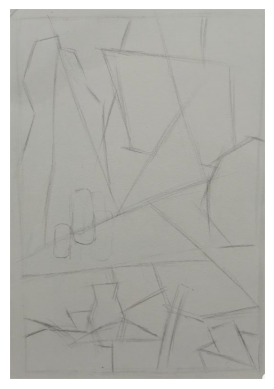

🎨 Técnica: sketching | Estilo: romanticism | Tema: still life
✨ Total aesthetic score: 10.71
📐 Composición: 1.86 | 🧱 Detalles: 1.86
🗣️ Comentario: The theme is unclear, the composition is not good, and there are no details
🔗 Similaridad: 0.235



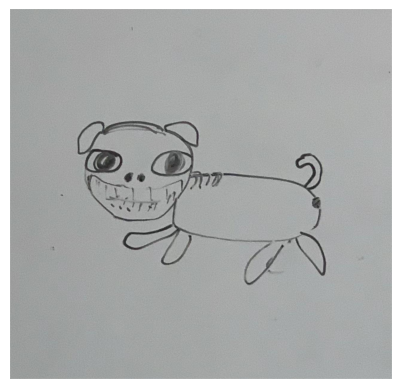

🎨 Técnica: sketching | Estilo: romanticism | Tema: landscapes
✨ Total aesthetic score: 17.5
📐 Composición: 2.33 | 🧱 Detalles: 2.33
🗣️ Comentario: The composition layout is relatively simple, with a single black and white hierarchy, unclear themes, and missing details
🔗 Similaridad: 0.213



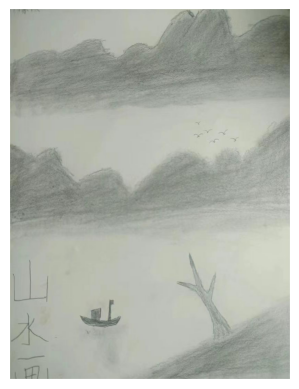

🎨 Técnica: sketching | Estilo: romanticism | Tema: portraiture
✨ Total aesthetic score: 18.33
📐 Composición: 2.17 | 🧱 Detalles: 2.0
🗣️ Comentario: The picture is incomplete and the basic painting content is not established. There is no value to evaluate,
🔗 Similaridad: 0.193



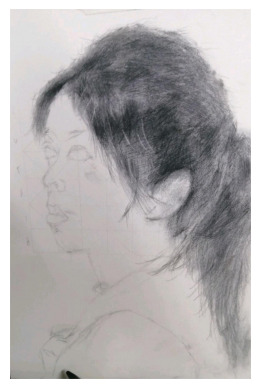

🎨 Técnica: sketching | Estilo: romanticism | Tema: landscapes
✨ Total aesthetic score: 21.67
📐 Composición: 3.33 | 🧱 Detalles: 2.67
🗣️ Comentario: The composition layout is relatively simple, with a single black and white hierarchy, unclear themes, and missing details
🔗 Similaridad: 0.191



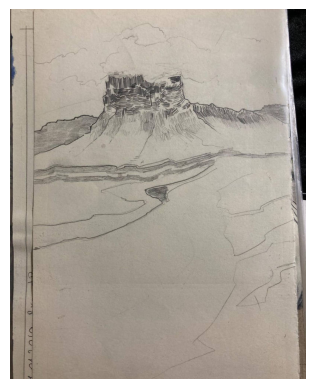

🎨 Técnica: sketching | Estilo: romanticism | Tema: portraiture
✨ Total aesthetic score: 15.71
📐 Composición: 2.57 | 🧱 Detalles: 1.86
🗣️ Comentario: The picture is too simple, without any visual appeal, and the picture is sloppy. Not serious enough.
🔗 Similaridad: 0.185



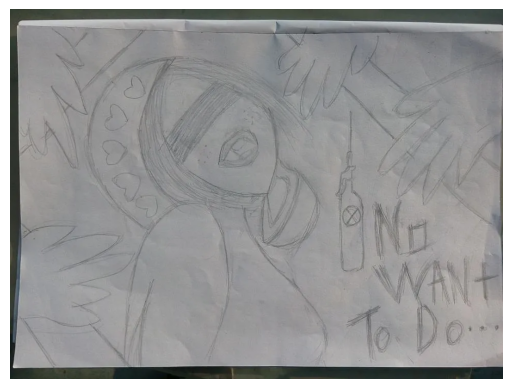

🎨 Técnica: sketching | Estilo: romanticism | Tema: still life
✨ Total aesthetic score: 16.67
📐 Composición: 2.67 | 🧱 Detalles: 2.5
🗣️ Comentario: The entire picture is not completed, with average creativity, lacking freshness and strong visual impact, and poor detail handling
🔗 Similaridad: 0.183



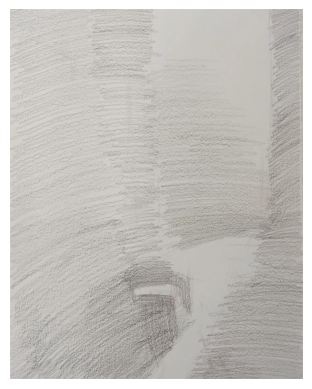

In [ ]:
# Conectar botón a función
boton_buscar.on_click(on_buscar_click)

# Organizar UI
ui = widgets.VBox([
    texto_busqueda,
    slider_top_n,
    dropdown_tecnica,
    boton_buscar
])

display(ui)


In [ ]:
df_split.head()

,filename,category,Total aesthetic score,Layout and composition,The overall,Details and texture,comment,technique,style,theme,comment_clean
0,0000d0cd38984fffb2c04f964edc9c88.png,traditional Chinese painting*meticulous*mounta...,65.83,6.00,6.50,6.50,The composition of the picture is rigid and la...,traditional Chinese painting,meticulous,mountains and water,the composition of the picture is rigid and la...
1,000ce20bcec24f29815a9496bf314c11.jpg,sketching*classicism*still life,60.71,6.71,5.86,5.14,"Each side of the picture is good, making it a ...",sketching,classicism,still life,each side of the picture is good making it a g...
2,000d472bde3c4f4c8dc9f66fede4d463.jpg,oil painting*romanticism*landscapes,65.00,6.20,6.60,6.40,None,oil painting,romanticism,landscapes,none
3,00122f4a71a847a4b076756dbbf7b349.jpg,oil painting*symbolism*still life,82.86,8.29,8.14,8.14,None,oil painting,symbolism,still life,none
4,00148cf2d7134849872279e21131540c.png,traditional Chinese painting*meticulous*mounta...,66.67,6.67,6.67,7.00,"The composition is full, the details are rich,...",traditional Chinese painting,meticulous,mountains and water,the composition is full the details are rich t...


### LDA (Latent Dirichlet Allocation)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# 1. Crear una matriz de documento-término
vectorizer = CountVectorizer(max_df=0.95, min_df=2, stop_words='english')
dtm = vectorizer.fit_transform(df_split['comment_clean'])

# 2. Ajustar LDA con 5 temas (puedes ajustar n_components)
lda = LatentDirichletAllocation(n_components=5, random_state=42)
lda.fit(dtm)

# 3. Mostrar las palabras clave de cada tema
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print(f"Tema {topic_idx+1}:")
        print(" ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]))

display_topics(lda, vectorizer.get_feature_names_out(), 10)


Tema 1:
color composition rich details picture expression tone complete character lacking
Tema 2:
light details composition contrast color shadow picture slightly white sense
Tema 3:
picture painting calligraphy delicate elements rich ink interesting intuitive complement
Tema 4:
picture sense colors brushstrokes details screen overall composition strong artistic
Tema 5:
painting characters traditional chinese making character innovative entire expressions lively


### Modelo Keras

Modelo en Keras para clasificar 'style' o 'theme' desde comentarios

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Preprocesar los textos
tokenizer = Tokenizer(num_words=10000)
tokenizer.fit_on_texts(df_split['comment_clean'])

X = tokenizer.texts_to_sequences(df_split['comment_clean'])
X = pad_sequences(X, maxlen=100)

# Usar por ejemplo "style" como variable objetivo
y = df_split['style'].astype('category').cat.codes  # convierte a números

# Modelo simple
model = Sequential([
    Embedding(input_dim=10000, output_dim=32, input_length=100),
    LSTM(32),
    Dense(16, activation='relu'),
    Dense(len(df_split['style'].unique()), activation='softmax')
])

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(X, y, epochs=5, batch_size=32, validation_split=0.2)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/5
251/251 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - accuracy: 0.2949 - loss: 1.4991 - val_accuracy: 0.4544 - val_loss: 1.2247
Epoch 2/5
251/251 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - accuracy: 0.5188 - loss: 1.0768 - val_accuracy: 0.4678 - val_loss: 1.1907
Epoch 3/5
251/251 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - accuracy: 0.5698 - loss: 0.9415 - val_accuracy: 0.4838 - val_loss: 1.1412
Epoch 4/5
251/251 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - accuracy: 0.5945 - loss: 0.8802 - val_accuracy: 0.5187 - val_loss: 1.1169
Epoch 5/5
251/251 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5899 - loss: 0.8598 - val_accuracy: 0.5232 - val_loss: 1.1697


## Conclusiones

El uso de `all-MiniLM-L6-v2`, un modelo ligero y efectivo de la familia Sentence-BERT, permitió generar embeddings densos y semánticamente significativos de descripciones artísticas y comentarios estéticos. Esto posibilitó medir similitudes conceptuales entre una búsqueda y el corpus.

La métrica de `**similitud del coseno** funcionó de manera eficiente para recuperar los resultados más cercanos en el espacio semántico, lo que sugiere que la estructura latente del significado fue correctamente capturada.

Se implementó un **pipeline** de preprocesamiento básico del texto (limpieza, tokenización) adecuado para este tipo de tareas donde se prioriza el sentido completo de frases sobre el análisis morfosintáctico.

Este proyecto cumple con los objetivos técnicos de integrar procesamiento de texto, modelos de lenguaje y recuperación semántica. Sin embargo, considero que la solución no cumple al 100% con lo que se buscaba (búsqueda de inspiración artística), ya que al realizar distintas pruebas, las imágenes entregadas como respuesta a la solicitud del usuario no siempre son correctas o coinciden con lo solicitado. Considero que esto se debe a que, aunque el objetivo se centra más en las imágenes, el dataset utilizado solo contiene comentarios para aproximadamente la mitad del total de imágenes, y dichos comentarios no siempre son descriptivos, sino más bien observaciones generales sobre la obra.

Debido a esto, considero que lo más adecuado a futuro es basar la búsqueda en las calificaciones asignadas a cada obra, más que en los comentarios. En lugar de entregar imágenes al usuario a partir de una descripción o significado, sería mejor que la búsqueda se fundamente en la calidad de la obra, medida por los datos que tenemos (puntuación/nota de composición, estructura, etc.). De esta forma, se podrían entregar imágenes según la calidad estética solicitada, mostrando al usuario cómo en el arte profesional se evalúa la calidad de una obra. Más adelante, se podría incorporar el uso de redes neuronales para clasificar las imágenes por tonos, estilos y formas comunes, y así acercarnos a nuestro objetivo original: crear un verdadero asistente creativo para la comunidad artística.